In [ ]:
!python -m pip install pyyaml==5.1
import sys, os, distutils.core
# Note: This is a faster way to install detectron2 in Colab, but it does not include all functionalities.
# See https://detectron2.readthedocs.io/tutorials/install.html for full installation instructions
!git clone 'https://github.com/facebookresearch/detectron2'
dist = distutils.core.run_setup("./detectron2/setup.py")
!python -m pip install {' '.join([f"'{x}'" for x in dist.install_requires])}
sys.path.insert(0, os.path.abspath('./detectron2'))

# Properly install detectron2. (Please do not install twice in both ways)
# !python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'

!pip install -q torchmetrics
!pip install -q geopandas
!pip install -q rasterio

In [2]:
import torch, detectron2
!nvcc --version
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
print("detectron2:", detectron2.__version__)

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2023 NVIDIA Corporation
Built on Tue_Aug_15_22:02:13_PDT_2023
Cuda compilation tools, release 12.2, V12.2.140
Build cuda_12.2.r12.2/compiler.33191640_0
torch:  1.12 ; cuda:  cu102
detectron2: 0.6


In [3]:
# Some basic setup:
# Setup detectron2 logger
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random, glob

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog
from detectron2.structures import BoxMode

from torchmetrics import detection
import torchvision.ops.boxes as bops

import geopandas as gpd
import rasterio
from rasterio.plot import show
import matplotlib.pyplot as plt
import matplotlib as mpl
import matplotlib.patches as patches

### Read data

In [7]:
from detectron2.data.datasets import register_coco_instances
register_coco_instances("hp_train", {}, "coco_format_12_4/project_building_properties_right-coco-1/annotations/instances_default.json", "mapillary_images")
register_coco_instances("hp_test", {}, "coco_format_12_4/project_building_properties_left-coco-1/annotations/instances_default.json", "mapillary_images")

In [8]:
train_json = open('coco_format_12_4/project_building_properties_right-coco-1/annotations/instances_default.json')
train_json = json.load(train_json)
val_json = open('coco_format_12_4/project_building_properties_left-coco-1/annotations/instances_default.json')
val_json = json.load(val_json)

In [9]:
len(train_json['images']), len(val_json['images']), len(train_json['annotations']), len(val_json['annotations'])

(13476, 13549, 5549, 6484)

### Visualize some data

In [10]:
labels = open('coco_format_12_4/project_building_properties_right-coco-1/annotations/instances_default.json')
labels = json.load(labels)

/usr/local/lib/python3.10/dist-packages/rasterio/__init__.py:304: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


LABEL:  {'id': 1807, 'image_id': 3608, 'category_id': 1, 'segmentation': [], 'area': 67308.91900000001, 'bbox': [573.17, 393.56, 450.83, 149.3], 'iscrowd': 0, 'attributes': {'building_completeness': 'complete', 'building_condition': 'fair', 'building_material': 'plaster', 'building_security': 'secured', 'building_use': 'residential', 'occluded': False, 'rotation': 0.0}}
1002750121041508_right
LABEL:  {'id': 2194, 'image_id': 4764, 'category_id': 1, 'segmentation': [], 'area': 258493.37760000007, 'bbox': [0.0, 513.55, 564.84, 457.64], 'iscrowd': 0, 'attributes': {'building_completeness': 'complete', 'building_condition': 'good', 'building_material': 'plaster', 'building_security': 'unsecured', 'building_use': 'residential', 'occluded': False, 'rotation': 0.0}}
2537352306423604_right


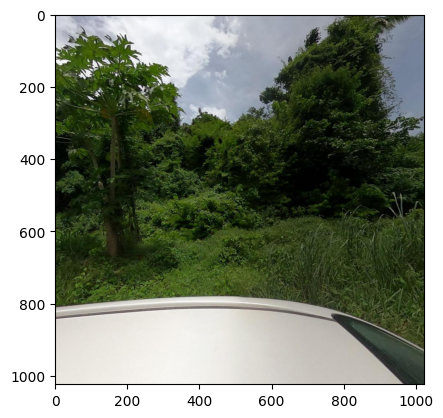

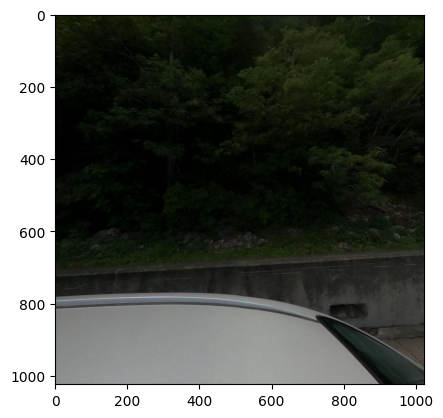

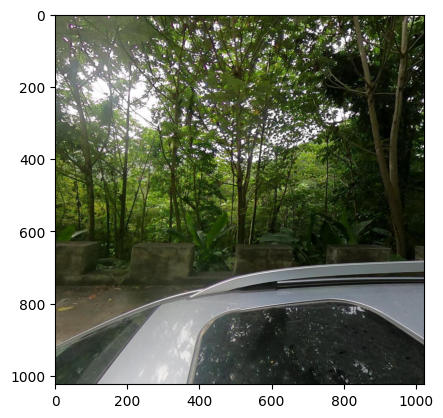

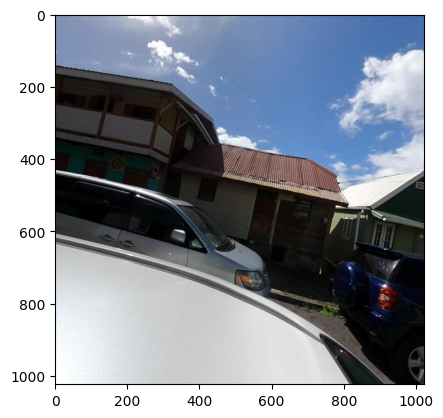

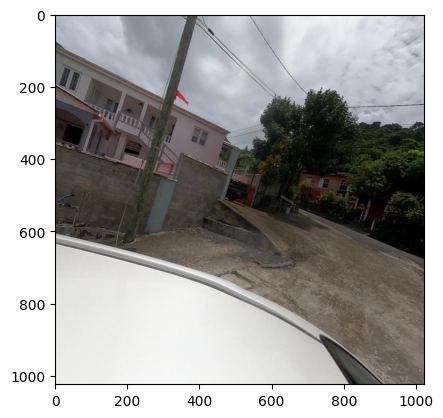

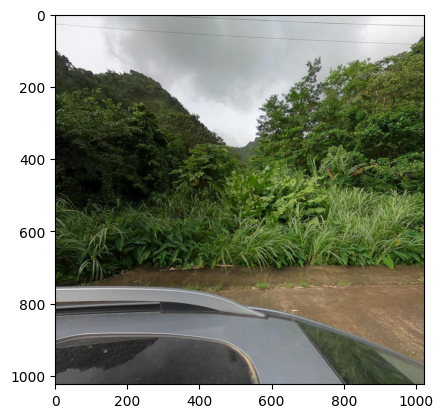

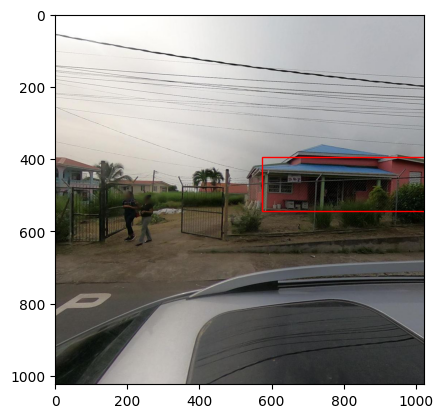

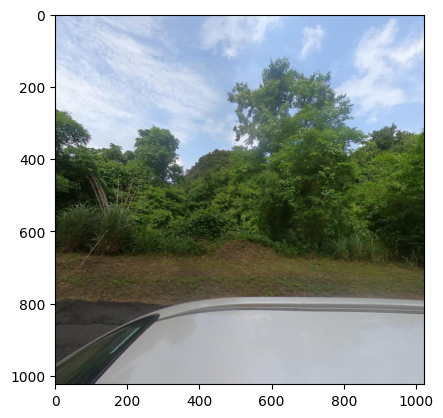

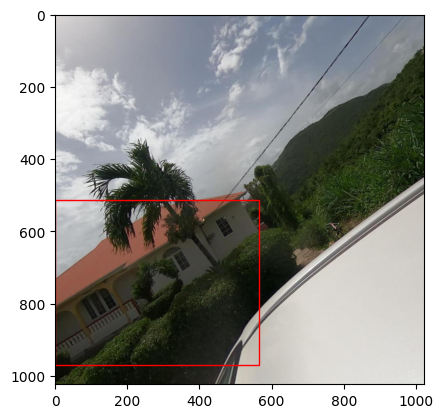

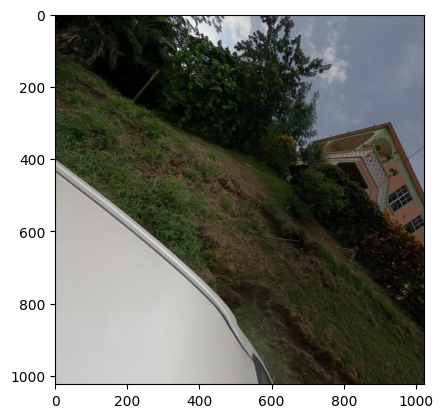

In [ ]:
from random import shuffle
tiles = glob.glob('mapillary_images/*/*/*.jpg')
shuffle(tiles)
for t in tiles[0:10]:
  filename_split = os.path.splitext(t)
  filename_zero, fileext = filename_split
  basename = os.path.basename(filename_zero)
  img = rasterio.open(t)
  imgr = img.read()
  # Create figure and axes
  fig, ax = plt.subplots()

  # Display the image
  ax.imshow(imgr.transpose(1,2,0))

  # Create Rectangle patches
  for l in labels['images']:
      if l['file_name'] == t.replace('mapillary_images/', ''):
        img_id = l['id']
        i = 0
        for l in labels['annotations']:
          if l['image_id'] == img_id:
            print("LABEL: ", l)
            print(basename)
            rect_name = 'rect_'+str(i)
            class Rectv:
                rect_name = 'rect_'+str(i)
            r = Rectv()
            setattr(r, rect_name, rect_name)
            r.rect_name = patches.Rectangle((l['bbox'][0], l['bbox'][1]), l['bbox'][2], l['bbox'][3], linewidth=1, edgecolor='r', facecolor='none')
            ax.add_patch(r.rect_name)
            i = i+1
          else:
            continue

  #fig.savefig('tiles_plots/'+basename+'.png', dpi=90, bbox_inches='tight')

### Train

In [5]:
from detectron2.engine import DefaultTrainer

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/retinanet_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("hp_train",)
cfg.DATASETS.TEST = ("hp_test",)
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/retinanet_R_50_FPN_3x.yaml")
cfg.SOLVER.IMS_PER_BATCH = 2  
cfg.SOLVER.BASE_LR = 0.00025
cfg.SOLVER.MAX_ITER = 10000 
cfg.SOLVER.STEPS = []        # do not decay learning rate
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 512 #128   # The "RoIHead batch size". 128 is faster, and good enough for this toy dataset (default: 512)
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1  # (see https://detectron2.readthedocs.io/tutorials/datasets.html#update-the-config-for-new-datasets)
# NOTE: this config means the number of classes, but a few popular unofficial tutorials incorrect uses num_classes+1 here.

# UNCOMMENT BELOW TO TRAIN

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()


'\nos.makedirs(cfg.OUTPUT_DIR, exist_ok=True)\ntrainer = DefaultTrainer(cfg)\ntrainer.resume_or_load(resume=False)\ntrainer.train()\n'

In [10]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output

<IPython.core.display.Javascript object>

In [6]:
# Inference should use the config with parameters that are used in training
# cfg now already contains everything we've set previously. We changed it a little bit for inference:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # path to the model we just trained
cfg.MODEL.RETINANET.SCORE_THRESH_TEST = 0.5
predictor = DefaultPredictor(cfg)

[12/19 05:59:10 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output/model_final.pth ...


In [12]:
inference_image_output = "./output/test_inference_images/"
os.makedirs(inference_image_output, exist_ok=True)

### Inference

In [ ]:
outputs_test = []
for t in val_json['images']:
  tf = t['file_name']
  ti = t['id']
  im = cv2.imread("./mapillary_images/"+tf)
  outputs = predictor(im)
  outputs_test.append(outputs)
  # We can use `Visualizer` to draw the predictions on the image.
  v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TEST[0]), scale=1.2)
  out = v.draw_instance_predictions(outputs["instances"].to("cpu")) #, edge_color='springgreen')
  for gt in val_json['annotations']:
    if gt['image_id'] == ti:
      bb = gt['bbox']
      bbxyxy = (bb[0], bb[1]+bb[3], bb[0]+bb[2], bb[1])
      out = v.draw_box(box_coord = bbxyxy, edge_color='dodgerblue')

  cv2_imshow(out.get_image()[:, :, ::-1])
  cv2.imwrite(inference_image_output+tf, out.get_image()[:, :, ::-1])

Some attributes of the predictions

In [ ]:
print(outputs["instances"].pred_classes)
print(outputs["instances"].pred_boxes)
print(outputs["instances"].scores)

### Clip images by boxes

In [ ]:
# Clip boxes for training the secondary classifier first
partition = 'train'
partition_json = train_json

image_clipped_output = f"./output/{partition}_images_clipped/"
os.makedirs(image_clipped_output, exist_ok=True)

def clip_image_around_bbox(image, bbox):
    # Get the bounding box coordinates
    x1, y1, x2, y2 = bbox

    # Ensure the coordinates are within the image boundaries
    x1 = abs(max(0, int(x1)))
    y1 = abs(max(0, int(y1)))
    x2 = abs(min(int(x2), image.shape[1]))
    y2 = abs(min(int(y2), image.shape[0]))

    x1_ = min(abs(x1), abs(x2))
    x2_ = max(abs(x1), abs(x2))
    y1_ = min(abs(y1), abs(y2))
    y2_ = max(abs(y1), abs(y2))

    # Clip the image around the bounding box
    clipped_image = image[abs(y1_):abs(y2_), abs(x1_):abs(x2_)]
    return clipped_image

for t in partition_json['images']:
  tf = t['file_name']
  ti = t['id']
  im = cv2.imread("./mapillary_images/"+tf)
  for gt in partition_json['annotations']:
    if gt['image_id'] == ti:
      bb = gt['bbox']
      bb_xyxy = (bb[0], bb[1]+bb[3], bb[0]+bb[2], bb[1])
      clipped_img = clip_image_around_bbox(im, bb_xyxy)

      # Display the clipped image
      if len(clipped_img) > 0:
        image_clipped_output_dirs = tf.split('/')
        os.makedirs(image_clipped_output+'/'+image_clipped_output_dirs[0], exist_ok=True)
        os.makedirs(image_clipped_output+'/'+image_clipped_output_dirs[0]+'/'+image_clipped_output_dirs[1], exist_ok=True)
        print(inference_image_clipped_output_dirs)
        cv2.imwrite(image_clipped_output+tf,clipped_img)


In [ ]:
# Clip boxes for testing the secondary classifier first
partition = 'val'
partition_json = val_json

image_clipped_output = f"./output/{partition}_images_clipped/"
os.makedirs(image_clipped_output, exist_ok=True)

def clip_image_around_bbox_pred(image, bbox):
    # Get the bounding box coordinates
    x1, y1, x2, y2 = bbox
    # Clip the image around the bounding box
    clipped_image = image[abs(int(y1)):abs(int(y2)), abs(int(x1)):abs(int(x2))]
    return clipped_image

for t in partition_json['images'][0:100]:
  tf = t['file_name']
  ti = t['id']
  im = cv2.imread("./mapillary_images/"+tf)
  outputs = predictor(im)
  print(outputs["instances"].pred_boxes)
  pred_boxes = outputs["instances"].pred_boxes
  for pred_box in pred_boxes:

    bbox_data = [pred_box[0], pred_box[1], pred_box[2], pred_box[3]]
    clipped_img = clip_image_around_bbox_pred(im, bbox_data)

    image_clipped_output_dirs = tf.split('/')
    os.makedirs(image_clipped_output+'/'+image_clipped_output_dirs[0], exist_ok=True)
    os.makedirs(image_clipped_output+'/'+image_clipped_output_dirs[0]+'/'+image_clipped_output_dirs[1], exist_ok=True)
    cv2.imwrite(image_clipped_output+tf,clipped_img)

In [ ]:
#preds = open('./output/coco_instances_results.json')
#preds = json.load(preds)

### WIP multi-label image classifier
Doesn't work currently because of lightning flash dependencies
Ref: https://lightning-flash.readthedocs.io/en/stable/reference/image_classification.html

In [ ]:
import flash
from flash import image
from flash.image import ImageClassificationData, ImageClassifier
import lightning.pytorch as pl
from torch.utils.data import random_split, DataLoader

def resolver(root, file_id):
    return os.path.join(root, f"{file_id}.jpg")

train_anns_df = pd.json_normalize(train_json['annotations'])
train_images_df = pd.json_normalize(train_json['images'])
train_images_df['image_id'] = train_images_df['id']
train_df = train_anns_df
train_df = pd.merge(train_images_df, train_anns_df, on=['image_id'])

val_anns_df = pd.json_normalize(val_json['annotations'])
val_images_df = pd.json_normalize(val_json['images'])
val_images_df['image_id'] = val_images_df['id']
val_df = val_anns_df
val_df = pd.merge(val_images_df, val_anns_df, on=['image_id'])

partition_train = 'train'
image_clipped_output_train = f"./output/{partition_train}_images_clipped/"
partition_val = 'val'
image_clipped_output_val = f"./output/{partition_val}_images_clipped/"


datamodule = ImageClassificationData.from_data_frame(
    input_field="file_name",
    target_fields=["attributes.building_completeness", "attributes.building_condition", "attributes.building_material", "attributes.building_security", "attributes.building_use"],
    train_data_frame=train_df[:10],
    train_images_root=image_clipped_output_train,
    val_data_frame=val_df[:10],
    val_images_root=image_clipped_output_val,
    transform_kwargs={"image_size": (128, 128)},
    batch_size=1,
)

print(datamodule.num_classes)
print(datamodule.labels)


model = ImageClassifier(backbone="resnet18", labels=datamodule.labels, multi_label=datamodule.multi_label)

trainer = flash.Trainer(max_epochs=3, gpus=torch.cuda.device_count())
trainer.finetune(model, datamodule=datamodule, strategy="freeze")

datamodule = ImageClassificationData.from_files(
    predict_files=[
        "./output/test_inference_images_clipped/EApbxsRqTSOc5a0K4CQg9r/left/342161371579010_left.jpg",
    ],
    batch_size=1,
)
predictions = trainer.predict(model, datamodule=datamodule, output="labels")
print(predictions)

trainer.save_checkpoint("image_classification_multi_label_model.pt")